# Debt Price Driven Model

## Overview

The purpose of this experiment is to tune and test the PI controller, by driving the debt price directly.

## Shared setup and dependencies

In [1]:
from shared import *

In [2]:
%pip show cadCAD

Name: cadCAD
Version: 0.4.23
Summary: cadCAD: a differential games based simulation software package for research, validation, and         Computer Aided Design of economic systems
Home-page: https://github.com/cadCAD-org/cadCAD
Author: Joshua E. Jodesty
Author-email: joshua@block.science
License: LICENSE.txt
Location: /Users/bscholtz/workspace/reflexer/venv/lib/python3.8/site-packages
Requires: fn, pathos, pandas, funcy
Required-by: 
Note: you may need to restart the kernel to use updated packages.


# Parameters

These are the key model parameters:
* `options.DebtPriceSource == options.DebtPriceSource.EXTERNAL`, with a step input sweep set as the debt price external data source, and a market model trained using historical debt price data.

In [3]:
length = 24*30
control_period = 3600
timestep = 24

# debt_price_data = [step_dataframe(20, i) for i in np.around(np.arange(0.05, 1.0, 0.05), decimals=2)]

debt_price_data = [
    step_dataframe(timestep, 0.1, time_period=control_period, length=length),
#     step_dataframe(timestep/2, 0.1, time_period=control_period*2, length=length),
#     step_dataframe(timestep/4, 0.1, time_period=control_period*4, length=length)
]
debt_price_data[0].iloc[timestep]

seconds_passed    3600.0
price_move           0.1
Name: 24, dtype: float64

* PI controller constant sweep

In [4]:
kp_sweep = [-6.944e-6]
ki_sweep = [lambda control_period=3600: -1e-10/control_period]

# kp_sweep = [-6.944e-06]
# ki_sweep = [-60.0/time_period]

# kp_sweep = [6.944e-9]
# ki_sweep = [0] #-60.0/time_period -1e-10/time_period

In [5]:
controller_sweep = list(itertools.product(kp_sweep, ki_sweep))
controller_sweep

kp_sweep = [x[0] for x in controller_sweep]
ki_sweep = [x[1] for x in controller_sweep]

print(kp_sweep)
print(ki_sweep)

[-6.944e-06]
[<function <lambda> at 0x10c9f1790>]


* Error term calculation

In [6]:
error_term = [
    lambda target, measured: target - measured,
    #lambda target, measured: (target - measured) / measured,
    #lambda target, measured: (target - measured) / target
]

* Integral type

In [7]:
integral_type = [options.IntegralType.DEFAULT.value]

## Simulation Configuration

Set the simulation timesteps to the minimum dataset length:

In [8]:
minimum_timesteps = min([df.shape[0] for df in debt_price_data])
SIMULATION_TIMESTEPS = range(minimum_timesteps)
SIMULATION_TIMESTEPS

range(0, 720)

Override certain parameter sweeps with the generated sets, using ConfigWrapper for convenience:

In [9]:
from itertools import chain

shock_amplitudes = [0.01, 0.5, 1.0]
sinusoid_frequency = 0.05

shocks = list(chain(*[[
        lambda timestep, shock_amplitude=shock_amplitude: shock_amplitude if timestep in [50, 100, 150, 200, 251, 301, 351, 401] else (-shock_amplitude if timestep in [51, 101, 151, 201, 250, 300, 350, 400] else 0),
        lambda timestep, shock_amplitude=shock_amplitude: shock_amplitude if timestep == 50 else (-shock_amplitude if timestep == length/2 else 0),
        lambda timestep, shock_amplitude=shock_amplitude: shock_amplitude/50 * np.sin(timestep * sinusoid_frequency) if timestep <= length/2 else 0,
    ] for shock_amplitude in shock_amplitudes])
) + [
    lambda timestep: 0.1/50 * np.sin(timestep * sinusoid_frequency),
    lambda timestep: 0.1/50 * np.sin(timestep * sinusoid_frequency),
    lambda timestep: 0.1/50 * np.sin(timestep * sinusoid_frequency)
]

control_delays = [
    (lambda _timestep: 1200) for _ in range(len(shocks) - 3)
] + [
    lambda timestep: 3600 if timestep in chain(range(50, 100), range(300, 350)) else 1200,
    lambda timestep: 3600*2 if timestep in chain(range(50, 100), range(300, 350)) else 1200,
    lambda timestep: 3600*3 if timestep in chain(range(50, 100), range(300, 350)) else 1200,
]

# Update parameter options
update_params = {
    # By using an Enum, we can self-document all possible options
    options.DebtPriceSource.__name__: [options.DebtPriceSource.EXTERNAL.value],
    options.MarketPriceSource.__name__: [options.MarketPriceSource.DEFAULT.value],
    options.IntegralType.__name__: integral_type,
    'controller_enabled': [True],
    # A lambda that takes the timestep and returns the corresponding value
    'expected_control_delay': control_delays,
    'price_move': shocks,
    'kp': kp_sweep,
    'ki': ki_sweep,
    # Select or sweep the error term calculation, as a lambda
    # e.g. p*-p vs (p*-p)/p vs (p*-p)/p*
    'error_term': error_term,
}

'''
The ConfigWrapper allows you to pass a model as an argument, and update the simulation configuration.
Maps (params, states) would be merge updated, and all other options are overrides.
'''
system_simulation = ConfigWrapper(system_model, M=update_params, N=4, T=SIMULATION_TIMESTEPS)

## Simulation Execution

In [10]:
del configs[:]

system_simulation.append()

(data, tensor_field, sessions) = run(drop_midsteps=True)


                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 12
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (720, 23, 4, 15)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 7, 7, 7, 7, 8, 8, 8, 8, 9, 9, 9, 9, 10, 10, 10, 10, 11, 11, 11, 11]
SubsetIDs: [0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 7, 7, 7, 7, 8, 8, 8, 8, 9, 9, 9, 9, 10, 10, 10, 10, 11, 11, 11, 11]
Ns       : [0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3]
ExpIDs   : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

## Data Analysis

In [11]:
df = data.copy()
df

,index,error_star,error_hat,old_error_star,old_error_hat,error_star_integral,error_hat_integral,error_star_derivative,error_hat_derivative,target_rate,...,market_price,debt_price,timedelta,timestamp,blockheight,simulation,subset,run,substep,timestep
0,0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,1.000000,1.000000,0,2018-12-18 00:00:00,0,0,0,1,0,0
1,6,0.002300,0.002300,0.0,0.0,7.464650,7.464650,3.543368e-07,3.543368e-07,-1.597131e-08,...,0.997700,1.000000,6491,2018-12-18 01:48:11,432,0,0,1,6,1
2,12,0.003376,0.003479,0.0,0.0,17.990372,18.182617,2.900440e-07,2.900440e-07,-2.344185e-08,...,0.996521,1.000000,3709,2018-12-18 02:50:00,679,0,0,1,6,2
3,18,0.003875,0.004066,0.0,0.0,36.937869,37.899021,9.561735e-08,9.561735e-08,-2.691197e-08,...,0.995934,1.000000,5226,2018-12-18 04:17:06,1027,0,0,1,6,3
4,24,0.004031,0.004362,0.0,0.0,62.460647,65.106170,2.412413e-08,2.412413e-08,-2.799372e-08,...,0.995638,1.000000,6456,2018-12-18 06:04:42,1457,0,0,1,6,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34603,207383,0.011386,0.004657,0.0,0.0,-11631.972592,1222.644370,4.984931e-08,4.984931e-08,-7.882284e-08,...,1.047283,1.051940,4779,2019-02-05 15:34:32,285648,11,11,4,6,716
34604,207389,0.010283,0.002030,0.0,0.0,-11588.232368,1236.143020,-2.731896e-07,-2.731896e-07,-7.112088e-08,...,1.047987,1.050017,4037,2019-02-05 16:41:49,285917,11,11,4,6,717
34605,207395,0.014428,0.004531,0.0,0.0,-11523.142027,1253.424108,7.867871e-07,7.867871e-07,-9.997065e-08,...,1.043539,1.048069,5268,2019-02-05 18:09:37,286268,11,11,4,6,718
34606,207401,0.013002,0.001694,0.0,0.0,-11467.855594,1265.969093,-3.536990e-07,-3.536990e-07,-9.000441e-08,...,1.044407,1.046101,4031,2019-02-05 19:16:48,286536,11,11,4,6,719


In [12]:
df['target_rate_hourly'] = df.target_rate # * 3600
df['error_star_derivative_scaled'] = df.error_star_derivative * 3600
df['error_hat_derivative_scaled'] = df.error_star_derivative * 3600

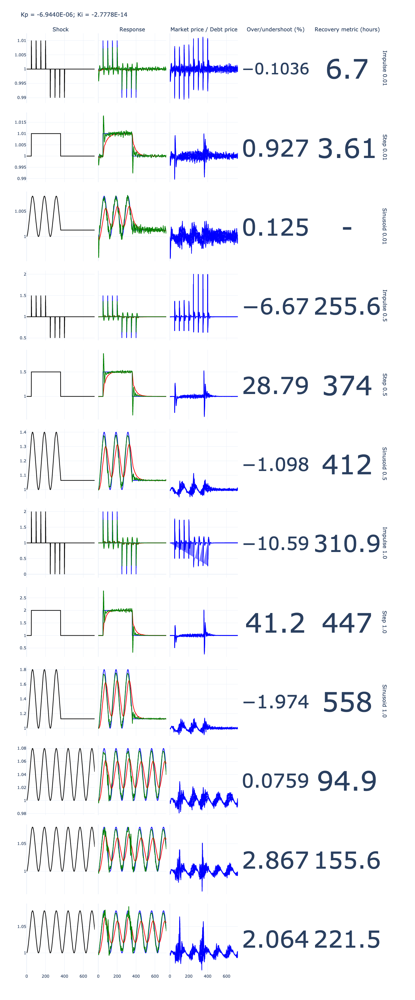

In [13]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

rows = len(shocks)

fig = make_subplots(
    rows=rows,
    cols=5,
    shared_xaxes=True,
    shared_yaxes='rows',
    horizontal_spacing=0.01,
    vertical_spacing=0.01,
    column_titles=['Shock', 'Response', 'Market price / Debt price', 'Over/undershoot (%)', 'Recovery metric (hours)'],
    row_titles=['Impulse 0.01', 'Step 0.01', 'Sinusoid 0.01', 'Impulse 0.5', 'Step 0.5', 'Sinusoid 0.5', 'Impulse 1.0', 'Step 1.0', 'Sinusoid 1.0',],
    specs=[[{'type' : 'xy'}, {'type' : 'xy'}, {'type' : 'xy'}, {'type' : 'indicator'}, {'type' : 'indicator'}] for _ in range(rows)],
)

for subset in range(df.subset.max() + 1):
    dataset = df[df.subset == subset]
    
    dataset['relative_diff'] = df.market_price / df.debt_price
    
    reasonable_steady_state_error = 0.01
    dataset['pct_error'] = dataset['error_hat'] / dataset['debt_price']
    dataset['pct_error'] = dataset['pct_error'].abs()
    recovery_metric = dataset[dataset.pct_error > reasonable_steady_state_error].groupby(['run'])['timedelta'].sum().mean()/3600
    
    timesteps = dataset.timestep
    grouped = dataset.groupby('timestep', as_index=False)
    mean = grouped.mean()
    std = grouped.std()

    row = subset + 1
    
    col = 1
    fig.add_trace(go.Scatter(name='debt_price', x=dataset[dataset.run == 1].timestep, y=dataset[dataset.run == 1]['debt_price'], line_color='black'),
                  row=row, col=col)
    
    col = 2
    fig.add_trace(go.Scatter(name='debt_price', x=dataset['timestep'], y=mean['debt_price'], line_color='blue'),
                  row=row, col=col)
    fig.add_trace(go.Scatter(name='target_price', x=dataset['timestep'], y=mean['target_price'], line_color='red'),
                  row=row, col=col)
    fig.add_trace(go.Scatter(name='market_price', x=dataset['timestep'], y=mean['market_price'], line_color='green'),
                  row=row, col=col)
    
    col = 3    
    fig.add_trace(go.Scatter(x=timesteps, y=mean['relative_diff'] + std['relative_diff'], name='mean + std', mode='lines', line_color='blue'), row=row, col=col)
    fig.add_trace(go.Scatter(x=timesteps, y=mean['relative_diff'], name='mean', fill='tonexty', mode='lines', line_color='blue'), row=row, col=col)
    fig.add_trace(go.Scatter(x=timesteps, y=mean['relative_diff'] - std['relative_diff'], name='mean - std', fill='tonexty', mode='lines', line_color='blue'), row=row, col=col)
    
    col = 4
    fig.add_trace(go.Indicator(
        name='Over/undershoot',
        mode='number',
        value=(dataset.market_price.max() - dataset.debt_price.max())/dataset.debt_price.max() * 100
    ), row=row, col=col)

    col = 5
    fig.add_trace(go.Indicator(
        name='Recovery metric',
        mode='number',
        value=recovery_metric
    ), row=row, col=col)
    
kp = update_params['kp'][0]
ki = update_params['ki'][0](3600)

fig.update_layout(title=f'Kp = {"{:.4E}".format(kp)}; Ki = {"{:.4E}".format(ki)}', height=3000, showlegend=False, template='plotly_white')
fig.show()
fig.write_image(f'plots/notebook_validation_shock_tests/shock_response-kp_{"{:.4E}".format(kp)}-ki_{"{:.4E}".format(ki)}.png', width='1800')